# From here

In [1]:
# from IPython.display import display, HTML
# display(HTML("<style>.container { width:80% !important; }</style>"))
%load_ext autotime

time: 0 ns (started: 2022-12-13 13:06:27 +09:00)


In [2]:
import numpy as np
import math
import tensorflow as tf
from sklearn.decomposition import PCA
from tensorflow.keras.models import Model
from tensorflow.keras import layers, losses
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
from numpy import savetxt
import pennylane as qml

time: 56.2 s (started: 2022-12-13 13:06:27 +09:00)


To see if the directory path is added to the sys.path, check `sys.path`

In [3]:
# Add directory path of the python-module files to import them.
import sys
# sys.path.insert(0,'/content/drive/MyDrive/qsvdd/QCNN_code_(working)/QCNN-main/Final_QCNN_mod')
sys.path

['C:\\Users\\user1\\Quantum\\qsvdd',
 'C:\\Users\\user1\\anaconda3\\python39.zip',
 'C:\\Users\\user1\\anaconda3\\DLLs',
 'C:\\Users\\user1\\anaconda3\\lib',
 'C:\\Users\\user1\\anaconda3',
 '',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\Pythonwin']

time: 16 ms (started: 2022-12-13 13:07:23 +09:00)


# Data Preparation
- 'MNIST' data is a dataset of 60,000, 28$\times$28 grayscale images of the 10 digits, along with a test set of 10,000 images.
- Each pixel has grey scale value that ranges from 0 to 255.
- More info can be found at the [MNIST homepage](http://yann.lecun.com/exdb/mnist/).
- QCNN : https://github.com/takh04/QCNN/blob/main/README.md


- for "0" image classification
- resize images to 256 to fit with 8 qubits

In [4]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()


time: 282 ms (started: 2022-12-13 13:07:23 +09:00)


In [5]:
x_train.shape

(60000, 28, 28)

time: 0 ns (started: 2022-12-13 13:07:24 +09:00)


In [6]:
x_train, x_test = x_train[..., np.newaxis] / 255.0, x_test[..., np.newaxis] / 255.0  # normalize the data

time: 266 ms (started: 2022-12-13 13:07:24 +09:00)


In [7]:
x_train_filter_0 = np.where(y_train == 1)
x_test_filter_0 = np.where(y_test == 1)

X_train = x_train[x_train_filter_0]
X_test = x_test[x_test_filter_0]
Y_train = y_train[x_train_filter_0]
Y_test = y_test[x_test_filter_0]

time: 16 ms (started: 2022-12-13 13:07:24 +09:00)


In [8]:
X_train.shape

(6742, 28, 28, 1)

time: 0 ns (started: 2022-12-13 13:07:24 +09:00)


In [9]:
X_train = tf.image.resize(X_train[:], (256, 1)).numpy()
X_test = tf.image.resize(X_test[:], (256, 1)).numpy()
X_train, X_test = tf.squeeze(X_train).numpy(), tf.squeeze(X_test).numpy()

time: 78 ms (started: 2022-12-13 13:07:24 +09:00)


In [10]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(6742, 256)
(1135, 256)
(6742,)
(1135,)
time: 0 ns (started: 2022-12-13 13:07:24 +09:00)


In [11]:
center = qml.numpy.zeros([6], requires_grad=True)
center_train = np.tile(center,(len(X_train),1))
center_train

tensor([[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]], requires_grad=True)

time: 15 ms (started: 2022-12-13 13:07:24 +09:00)


In [12]:
# center_train = center_train.detach().numpy()

time: 0 ns (started: 2022-12-13 13:07:24 +09:00)


In [13]:
%run ./qcnn_code/Angular_hybrid.py
%run ./qcnn_code/unitary.py
%run ./qcnn_code/embedding.py
%run ./qcnn_code/QCNN_circuit.py
%run ./qcnn_code/Training.py

time: 265 ms (started: 2022-12-13 13:07:24 +09:00)


In [14]:
train_Xdata = X_train
train_Ydata = center_train
conv_filter = 'U_SU4_no_pooling'
# parameter_weights = np.zeros(15)
num_params_conv = 15
data_encoding = 'Amplitude'
circuit_type = 'QCNN'
cost_func = 'svdd'
measure_basis = 'Z'

loss_history, est_params, param_history = circuit_training(X_train=train_Xdata,
                                            Y_train=train_Ydata,
                                            U=conv_filter,
                                            U_params=num_params_conv,
                                            embedding_type=data_encoding,
                                            circuit=circuit_type,
                                            cost_fn=cost_func,
                                            measure_axis=measure_basis)

C:\Users\user1\anaconda3\lib\site-packages\autograd\numpy\numpy_vjps.py:698: ComplexWarning: Casting complex values to real discards the imaginary part
  onp.add.at(A, idx, x)


iteration:  0  cost:  0.037441573348055576
iteration:  5  cost:  0.03783999218771263
iteration:  10  cost:  0.02130740262894462
iteration:  15  cost:  0.020264830641733136
iteration:  20  cost:  0.020681979918366213
iteration:  25  cost:  0.014677519404988498
iteration:  30  cost:  0.012712830666315433
iteration:  35  cost:  0.010976750413036791
iteration:  40  cost:  0.010177839012993961
iteration:  45  cost:  0.0077252409495336145
iteration:  50  cost:  0.012617900598389225
iteration:  55  cost:  0.009298798885281803
iteration:  60  cost:  0.0062364907713302956
iteration:  65  cost:  0.005386033722931059
iteration:  70  cost:  0.00651769604661711
iteration:  75  cost:  0.005948272318580921
iteration:  80  cost:  0.006166162043096427
iteration:  85  cost:  0.004511138488332384
iteration:  90  cost:  0.008885018936471712
iteration:  95  cost:  0.006205084925051949
iteration:  100  cost:  0.004635665286618663
iteration:  105  cost:  0.005118635559507008
iteration:  110  cost:  0.0033669

In [15]:
# from pennylane import numpy as np
# est_params = np.random.randn(45, requires_grad = True)
est_params

tensor([ 0.55120606,  0.83125964, -0.40186459,  0.81776656, -0.32034681,
         0.00973291,  0.36715613,  0.33812206,  1.05411497, -0.85280782,
         0.84414772, -0.8578724 ,  1.12632445, -0.10425453, -0.62115117,
        -0.39197969,  2.27825951,  0.34564132, -0.27508724,  2.50585074,
         0.90668803, -0.60310338, -1.07787675,  1.38572039, -0.3902484 ,
        -0.19255949, -0.15330255,  0.98360889,  0.54528085,  0.49966624,
        -0.29602287,  0.35660605, -1.58627673,  0.14228827,  0.59968823,
        -0.19989455,  0.96698705, -0.38104568, -0.62750832, -0.15329843,
         0.99766766, -0.59131201,  0.0302926 ,  0.66680537, -1.19148302,
         0.65449712, -1.71938122,  0.28456039, -1.52606136,  1.00767632,
        -0.70678876,  0.05132708, -1.47470302, -1.68489416, -0.68517418,
        -0.11655593, -1.25553479, -0.33562022,  0.84396409,  2.05816859,
        -0.21840302, -0.50386657, -1.58690499,  1.73580864,  0.87023695,
         1.49064635,  1.37878997,  0.17934681, -0.4

time: 16 ms (started: 2022-12-14 02:40:06 +09:00)


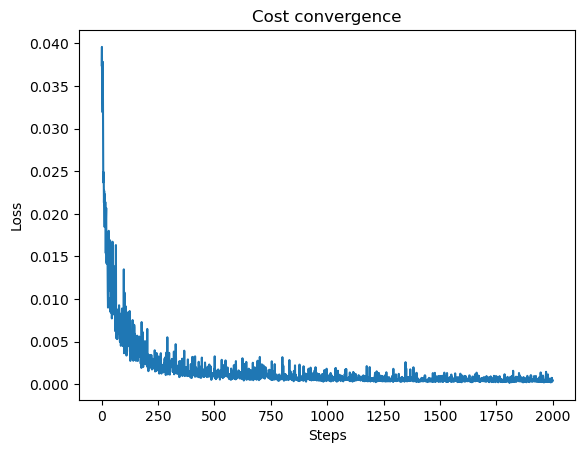

time: 406 ms (started: 2022-12-14 02:40:06 +09:00)


In [16]:
plt.plot(loss_history)
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Cost convergence")

plt.savefig('./img/OCC1/qsvdd/cost_qsvdd.png')

In [17]:
savetxt('./img/OCC1/qsvdd/param_list_qcnn',est_params.numpy(),delimiter=',')

time: 0 ns (started: 2022-12-14 02:40:06 +09:00)


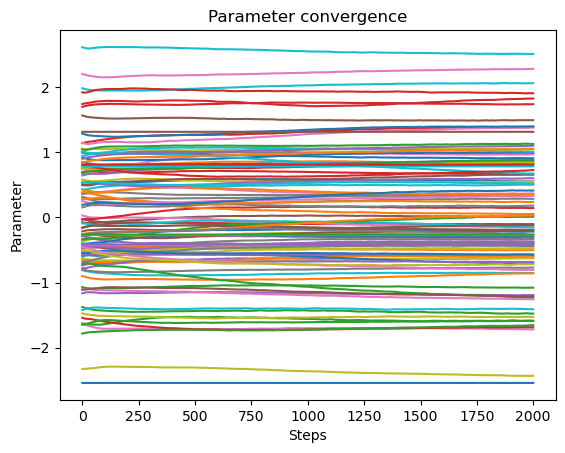

time: 500 ms (started: 2022-12-14 02:40:06 +09:00)


In [18]:
plt.plot(param_history)
plt.xlabel("Steps")
plt.ylabel("Parameter")
plt.title("Parameter convergence")
plt.savefig('./img/OCC1/qsvdd/parameters_qsvdd.png')

### train result

In [19]:
# Implement trained circuit for MNIST "1" train data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_train])

time: 1h 5min 24s (started: 2022-12-14 02:40:07 +09:00)


In [20]:
predictions_exp0

tensor([[ 0.0078127 , -0.00226104, -0.00095301,  0.0048742 , -0.00195408,
         -0.00465899],
        [ 0.00932939,  0.00091878,  0.01036545, -0.010268  ,  0.00590739,
         -0.00062491],
        [-0.00663928, -0.0017793 ,  0.0165134 , -0.00568672,  0.00295623,
         -0.01567577],
        ...,
        [-0.00065022,  0.00488969, -0.00731127,  0.00302205, -0.00408659,
         -0.00846704],
        [-0.00762625, -0.00670428,  0.00747809, -0.01267367, -0.00094505,
          0.00309123],
        [ 0.001466  ,  0.00594498, -0.00062413, -0.00730497, -0.00752178,
         -0.0034384 ]], requires_grad=True)

time: 0 ns (started: 2022-12-14 03:45:32 +09:00)


In [21]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]

time: 8.02 s (started: 2022-12-14 03:45:32 +09:00)


In [22]:
# center = center.detach().numpy()

time: 0 ns (started: 2022-12-14 03:45:40 +09:00)


In [23]:
# center[0]

time: 16 ms (started: 2022-12-14 03:45:40 +09:00)


In [24]:
predictions_exp=0

time: 0 ns (started: 2022-12-14 03:45:40 +09:00)


In [25]:
import plotly.express as px
import plotly.graph_objects as go


label_value_string = np.array(Y_train).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0[:,0], 
                          y = predictions_exp0[:,1], 
                          z = predictions_exp0[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)


fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)

fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()
fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_train.html')
# fig_test_ploty.write_html('Result/ploty_figure_test.html')

time: 14.1 s (started: 2022-12-14 03:45:40 +09:00)


In [26]:
# L1-norm of trained MNIST "0" train data
abs(predictions_exp0 - center).mean(axis=1).mean()

tensor(0.00619029, requires_grad=True)

time: 0 ns (started: 2022-12-14 03:45:54 +09:00)


In [27]:
score_train = abs(predictions_exp0 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:45:54 +09:00)


In [28]:
score_var_train = abs(predictions_exp0 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 03:45:54 +09:00)


### score for test data

In [29]:
# Implement trained circuit for MNIST "0" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0_test = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_test])

time: 11min 9s (started: 2022-12-14 03:45:54 +09:00)


In [30]:
print(predictions_exp0_test)
print(predictions_exp0_test.shape)

[[-2.51656363e-03 -1.94209606e-03  1.69065603e-02  2.83119040e-03
  -5.70171373e-03  4.31512790e-03]
 [ 6.59022546e-03  3.01823862e-03 -2.49630020e-03 -3.59177972e-03
   3.12405824e-03  5.27324825e-03]
 [ 6.51133182e-04  3.68282277e-03 -1.02285726e-02  1.29225539e-02
  -9.91201972e-03  3.41515062e-03]
 ...
 [-1.87347947e-03  3.03802963e-03 -3.60955163e-03 -1.73734418e-03
  -9.91871010e-03 -1.34896966e-02]
 [-1.04395500e-03  5.23653612e-03  9.73864903e-03 -3.14720813e-03
   3.45216081e-03  1.42867514e-03]
 [ 1.90248970e-03  3.52982106e-04  8.84389540e-05 -1.01226765e-02
   5.85303500e-03  6.70709702e-03]]
(1135, 6)
time: 0 ns (started: 2022-12-14 03:57:03 +09:00)


In [31]:
score_test0 = abs(predictions_exp0_test - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:57:03 +09:00)


In [32]:
score_var_test0 = abs(predictions_exp0_test - center).mean(axis=1)


time: 0 ns (started: 2022-12-14 03:57:03 +09:00)


In [33]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 03:57:03 +09:00)


In [34]:
import plotly.express as px
import plotly.graph_objects as go

label_value_string = np.array(Y_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0_test[:,0], 
                          y = predictions_exp0_test[:,1], 
                          z = predictions_exp0_test[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)
# fig_ploty.show()

fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test.html')

time: 359 ms (started: 2022-12-14 03:57:03 +09:00)


### score for test0

In [35]:
x_train_filter_1 = np.where(y_train == 0)
x_test_filter_1 = np.where(y_test == 0)

X1_train = x_train[x_train_filter_1]
X1_test = x_test[x_test_filter_1]
Y1_train = y_train[x_train_filter_1]
Y1_test = y_test[x_test_filter_1]

time: 47 ms (started: 2022-12-14 03:57:04 +09:00)


In [36]:
X1_train.shape

(5923, 28, 28, 1)

time: 0 ns (started: 2022-12-14 03:57:04 +09:00)


In [37]:
X1_train = tf.image.resize(X1_train[:], (256, 1)).numpy()
X1_test = tf.image.resize(X1_test[:], (256, 1)).numpy()
X1_train, X1_test = tf.squeeze(X1_train).numpy(), tf.squeeze(X1_test).numpy()

time: 31 ms (started: 2022-12-14 03:57:04 +09:00)


In [38]:
print(X1_train.shape)
print(X1_test.shape)
print(Y1_train.shape)
print(Y1_test.shape)

(5923, 256)
(980, 256)
(5923,)
(980,)
time: 16 ms (started: 2022-12-14 03:57:04 +09:00)


In [39]:
# Implement trained circuit for MNIST "1" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp1 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X1_test])

time: 9min 38s (started: 2022-12-14 03:57:04 +09:00)


In [40]:
print(predictions_exp1)
print(predictions_exp1.shape)

[[ 0.02357389  0.03020881 -0.01247404  0.05152019 -0.01782489  0.03237608]
 [ 0.01496446  0.0405605  -0.05121758 -0.01218193 -0.05071934  0.06160003]
 [-0.01271481  0.04868872  0.11415764  0.08992969 -0.00207808  0.02067135]
 ...
 [ 0.01690179 -0.00792925 -0.0045332   0.04491767 -0.00365238 -0.06337379]
 [ 0.00030891 -0.04224037  0.04315973  0.02165009 -0.01641888  0.03887111]
 [ 0.01074207  0.02193278 -0.03295368  0.01663264 -0.01047027  0.00164307]]
(980, 6)
time: 0 ns (started: 2022-12-14 04:06:42 +09:00)


In [41]:
# L1-norm of MNIST "1"
abs(predictions_exp1 - center).mean(axis=1).mean()

tensor(0.03210809, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:06:42 +09:00)


In [42]:
score_test1 = abs(predictions_exp1 - center).mean(axis=1).mean()

time: 16 ms (started: 2022-12-14 04:06:42 +09:00)


In [43]:
score_var_test1 = abs(predictions_exp1 - center).mean(axis=1)

time: 16 ms (started: 2022-12-14 04:06:42 +09:00)


In [44]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:06:42 +09:00)


In [45]:

label_value_string = np.array(Y1_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp1[:,0], 
                          y = predictions_exp1[:,1], 
                          z = predictions_exp1[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test0.html')

time: 187 ms (started: 2022-12-14 04:06:42 +09:00)


### score for test2

In [46]:
x_train_filter_2 = np.where(y_train == 2)
x_test_filter_2 = np.where(y_test == 2)

X2_train = x_train[x_train_filter_2]
X2_test = x_test[x_test_filter_2]
Y2_train = y_train[x_train_filter_2]
Y2_test = y_test[x_test_filter_2]

time: 47 ms (started: 2022-12-14 04:06:43 +09:00)


In [47]:
X2_train.shape

(5958, 28, 28, 1)

time: 0 ns (started: 2022-12-14 04:06:43 +09:00)


In [48]:
X2_train = tf.image.resize(X2_train[:], (256, 1)).numpy()
X2_test = tf.image.resize(X2_test[:], (256, 1)).numpy()
X2_train, X2_test = tf.squeeze(X2_train).numpy(), tf.squeeze(X2_test).numpy()

time: 16 ms (started: 2022-12-14 04:06:43 +09:00)


In [49]:
print(X2_train.shape)
print(X2_test.shape)
print(Y2_train.shape)
print(Y2_test.shape)

(5958, 256)
(1032, 256)
(5958,)
(1032,)
time: 0 ns (started: 2022-12-14 04:06:43 +09:00)


In [50]:
# Implement trained circuit for MNIST "2" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp2 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X2_test])

time: 10min 12s (started: 2022-12-14 04:06:43 +09:00)


In [51]:
print(predictions_exp2)
print(predictions_exp2.shape)

[[-0.01712745  0.01843465 -0.06911681  0.00745083 -0.00520566 -0.0344937 ]
 [-0.01903604  0.01535237  0.01545493  0.01304513  0.00838794  0.05325372]
 [ 0.05566175  0.01731368 -0.00353878  0.0072168  -0.03793748  0.04933659]
 ...
 [-0.04063227  0.08333476 -0.00682115  0.02013789 -0.0158649   0.02514314]
 [-0.04866233  0.00896633  0.03405482  0.02218966  0.00338911 -0.00252495]
 [ 0.01083798  0.00289783  0.04711491  0.03296123  0.02071698 -0.01211025]]
(1032, 6)
time: 0 ns (started: 2022-12-14 04:16:55 +09:00)


In [52]:
# L1-norm of MNIST "2"
abs(predictions_exp2 - center).mean(axis=1).mean()

tensor(0.02535834, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:16:55 +09:00)


In [53]:
score_test2 = abs(predictions_exp2 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:16:55 +09:00)


In [54]:
score_var_test2 = abs(predictions_exp2 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:16:55 +09:00)


In [55]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 31 ms (started: 2022-12-14 04:16:55 +09:00)


In [56]:
label_value_string = np.array(Y2_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp2[:,0], 
                          y = predictions_exp2[:,1], 
                          z = predictions_exp2[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test2.html')

time: 203 ms (started: 2022-12-14 04:16:55 +09:00)


### score for test3

In [57]:
x_train_filter_3 = np.where(y_train == 3)
x_test_filter_3 = np.where(y_test == 3)

X3_train = x_train[x_train_filter_3]
X3_test = x_test[x_test_filter_3]
Y3_train = y_train[x_train_filter_3]
Y3_test = y_test[x_test_filter_3]

X3_train.shape

(6131, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:16:55 +09:00)


In [58]:
X3_train = tf.image.resize(X3_train[:], (256, 1)).numpy()
X3_test = tf.image.resize(X3_test[:], (256, 1)).numpy()
X3_train, X3_test = tf.squeeze(X3_train).numpy(), tf.squeeze(X3_test).numpy()

print(X3_train.shape)
print(X3_test.shape)
print(Y3_train.shape)
print(Y3_test.shape)

(6131, 256)
(1010, 256)
(6131,)
(1010,)
time: 32 ms (started: 2022-12-14 04:16:55 +09:00)


In [59]:
# Implement trained circuit for MNIST "3" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp3 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X3_test])

time: 9min 56s (started: 2022-12-14 04:16:56 +09:00)


In [60]:
print(predictions_exp3)
print(predictions_exp3.shape)

[[ 0.01538859 -0.01889184 -0.09790611  0.03720418  0.02695333  0.00580348]
 [-0.03447607  0.01100391 -0.05501729  0.04286305 -0.01839807  0.00765833]
 [-0.00285973  0.00907936  0.05310911  0.02279287 -0.03156094  0.04189034]
 ...
 [-0.03789526  0.09800874  0.08197327 -0.01313567 -0.01479465  0.07292547]
 [-0.00335352  0.04220644  0.0303584  -0.01765269 -0.01977773  0.02357949]
 [ 0.00766801  0.00215905 -0.02790967  0.04335459 -0.01591023  0.01833177]]
(1010, 6)
time: 0 ns (started: 2022-12-14 04:26:52 +09:00)


In [61]:
# L1-norm of MNIST "3"
abs(predictions_exp3 - center).mean(axis=1).mean()

tensor(0.03038001, requires_grad=True)

time: 15 ms (started: 2022-12-14 04:26:52 +09:00)


In [62]:
score_test3 = abs(predictions_exp3 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:26:52 +09:00)


In [63]:
score_var_test3 = abs(predictions_exp3 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:26:52 +09:00)


In [64]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:26:52 +09:00)


In [65]:
label_value_string = np.array(Y3_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp3[:,0], 
                          y = predictions_exp3[:,1], 
                          z = predictions_exp3[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test3.html')

time: 203 ms (started: 2022-12-14 04:26:52 +09:00)


### score for test4

In [66]:
x_train_filter_4 = np.where(y_train == 4)
x_test_filter_4 = np.where(y_test == 4)

X4_train = x_train[x_train_filter_4]
X4_test = x_test[x_test_filter_4]
Y4_train = y_train[x_train_filter_4]
Y4_test = y_test[x_test_filter_4]

X4_train.shape

(5842, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:26:53 +09:00)


In [67]:
X4_train = tf.image.resize(X4_train[:], (256, 1)).numpy()
X4_test = tf.image.resize(X4_test[:], (256, 1)).numpy()
X4_train, X4_test = tf.squeeze(X4_train).numpy(), tf.squeeze(X4_test).numpy()

print(X4_train.shape)
print(X4_test.shape)
print(Y4_train.shape)
print(Y4_test.shape)

(5842, 256)
(982, 256)
(5842,)
(982,)
time: 16 ms (started: 2022-12-14 04:26:53 +09:00)


In [68]:
# Implement trained circuit for MNIST "4" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp4 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X4_test])

time: 9min 40s (started: 2022-12-14 04:26:53 +09:00)


In [69]:
print(predictions_exp4)
print(predictions_exp4.shape)

[[-9.27575071e-03 -2.02739580e-02  7.08007027e-05 -1.07758825e-02
  -1.37961467e-01 -2.15340420e-02]
 [-3.85083630e-02  3.15960789e-02 -2.16408378e-02  2.42470002e-02
   8.95398718e-02 -7.96885891e-03]
 [-4.75007956e-02 -1.31979682e-02  5.56194578e-02 -1.06482633e-03
  -2.09359337e-02 -1.67434542e-02]
 ...
 [ 1.38010128e-02  2.86186794e-02 -9.33736725e-03 -3.97408286e-02
  -1.34771410e-02  1.65480770e-02]
 [-5.37154289e-02  7.38533539e-02  1.19421514e-03 -3.24899086e-02
   1.77776360e-02  1.53588464e-02]
 [-1.74667264e-02  1.85829884e-02  1.84224805e-02 -3.44039962e-04
  -4.70256593e-03  1.70634282e-02]]
(982, 6)
time: 15 ms (started: 2022-12-14 04:36:33 +09:00)


In [70]:
# L1-norm of MNIST "4"
abs(predictions_exp4 - center).mean(axis=1).mean()

tensor(0.0228686, requires_grad=True)

time: 16 ms (started: 2022-12-14 04:36:33 +09:00)


In [71]:
score_test4 = abs(predictions_exp4 - center).mean(axis=1).mean()


time: 16 ms (started: 2022-12-14 04:36:33 +09:00)


In [72]:
score_var_test4 = abs(predictions_exp4 - center).mean(axis=1)

time: 15 ms (started: 2022-12-14 04:36:33 +09:00)


In [73]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:36:33 +09:00)


In [74]:
label_value_string = np.array(Y4_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp4[:,0], 
                          y = predictions_exp4[:,1], 
                          z = predictions_exp4[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test4.html')

time: 203 ms (started: 2022-12-14 04:36:33 +09:00)


### score for test5

In [75]:
x_train_filter_5 = np.where(y_train == 5)
x_test_filter_5 = np.where(y_test == 5)

X5_train = x_train[x_train_filter_5]
X5_test = x_test[x_test_filter_5]
Y5_train = y_train[x_train_filter_5]
Y5_test = y_test[x_test_filter_5]

X5_train.shape

(5421, 28, 28, 1)

time: 15 ms (started: 2022-12-14 04:36:34 +09:00)


In [76]:
X5_train = tf.image.resize(X5_train[:], (256, 1)).numpy()
X5_test = tf.image.resize(X5_test[:], (256, 1)).numpy()
X5_train, X5_test = tf.squeeze(X5_train).numpy(), tf.squeeze(X5_test).numpy()

print(X5_train.shape)
print(X5_test.shape)
print(Y5_train.shape)
print(Y5_test.shape)

(5421, 256)
(892, 256)
(5421,)
(892,)
time: 32 ms (started: 2022-12-14 04:36:34 +09:00)


In [77]:
X5_test = np.delete(X5_test,173,0)

time: 0 ns (started: 2022-12-14 04:36:34 +09:00)


In [78]:
# Implement trained circuit for MNIST "5" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp5 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X5_test])

time: 8min 48s (started: 2022-12-14 04:36:34 +09:00)


In [79]:
print(predictions_exp5)
print(predictions_exp5.shape)

[[-1.51959606e-03  2.43960882e-02  4.29423002e-02  1.04256707e-02
   2.06445770e-03 -2.79514066e-02]
 [ 1.72366020e-02  2.10409126e-02 -4.52423228e-02  3.57649613e-03
  -1.18318583e-01  7.93513161e-02]
 [ 4.09952483e-02  4.65176340e-02  1.34803232e-02  2.42965046e-03
  -6.96889691e-03 -1.85705640e-02]
 ...
 [-1.43480013e-02  1.28162578e-02  3.52593844e-03  8.84473377e-03
   2.27546411e-02 -2.16199002e-02]
 [ 1.72452205e-02  3.64382655e-03 -6.05617445e-02  3.16580568e-02
  -5.36418553e-04  3.04956890e-02]
 [-1.06966642e-04  1.72983410e-04 -6.89426251e-03  3.70889800e-02
  -4.97450807e-03  1.61092017e-02]]
(891, 6)
time: 0 ns (started: 2022-12-14 04:45:22 +09:00)


In [80]:
# L1-norm of MNIST "5"
abs(predictions_exp5 - center).mean(axis=1).mean()

tensor(0.03068054, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:45:22 +09:00)


In [81]:
score_test5 = abs(predictions_exp5 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:45:22 +09:00)


In [82]:
score_var_test5 = abs(predictions_exp5 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:45:22 +09:00)


In [83]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:45:22 +09:00)


In [84]:
label_value_string = np.array(Y5_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp5[:,0], 
                          y = predictions_exp5[:,1], 
                          z = predictions_exp5[:,2],
                          # color = label_value_string, 
                          opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test5.html')

time: 203 ms (started: 2022-12-14 04:45:22 +09:00)


### score for test6

In [85]:
x_train_filter_6 = np.where(y_train == 6)
x_test_filter_6 = np.where(y_test == 6)

X6_train = x_train[x_train_filter_6]
X6_test = x_test[x_test_filter_6]
Y6_train = y_train[x_train_filter_6]
Y6_test = y_test[x_test_filter_6]

X6_train.shape

(5918, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:45:22 +09:00)


In [86]:
X6_train = tf.image.resize(X6_train[:], (256, 1)).numpy()
X6_test = tf.image.resize(X6_test[:], (256, 1)).numpy()
X6_train, X6_test = tf.squeeze(X6_train).numpy(), tf.squeeze(X6_test).numpy()

print(X6_train.shape)
print(X6_test.shape)
print(Y6_train.shape)
print(Y6_test.shape)

(5918, 256)
(958, 256)
(5918,)
(958,)
time: 31 ms (started: 2022-12-14 04:45:22 +09:00)


In [87]:
# Implement trained circuit for MNIST "6" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp6 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X6_test])

time: 9min 25s (started: 2022-12-14 04:45:22 +09:00)


In [88]:
print(predictions_exp6)
print(predictions_exp6.shape)

[[-0.00215355 -0.02499383  0.02547279 -0.02641609  0.04735203 -0.00719592]
 [ 0.04967999  0.04457522 -0.02885887 -0.01440317  0.0358779  -0.0220911 ]
 [-0.01703013 -0.00809923  0.04021247  0.00263945 -0.00111261  0.00341954]
 ...
 [-0.00999743  0.03635175 -0.03848278 -0.07316148 -0.05344413 -0.02993318]
 [ 0.02052282  0.00491828  0.0100634   0.00141125 -0.00581899  0.00561697]
 [ 0.01401604  0.00499601  0.07982872  0.01825516  0.05653733  0.0089644 ]]
(958, 6)
time: 0 ns (started: 2022-12-14 04:54:48 +09:00)


In [89]:
# L1-norm of MNIST "6"
abs(predictions_exp6 - center).mean(axis=1).mean()

tensor(0.02836967, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:54:48 +09:00)


In [90]:
score_test6 = abs(predictions_exp6 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:54:48 +09:00)


In [91]:
score_var_test6 = abs(predictions_exp6 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:54:48 +09:00)


In [92]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:54:48 +09:00)


In [93]:
label_value_string = np.array(Y6_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp6[:,0], 
                          y = predictions_exp6[:,1], 
                          z = predictions_exp6[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test6.html')

time: 203 ms (started: 2022-12-14 04:54:48 +09:00)


### score for test7

In [94]:
x_train_filter_7 = np.where(y_train == 7)
x_test_filter_7 = np.where(y_test == 7)

X7_train = x_train[x_train_filter_7]
X7_test = x_test[x_test_filter_7]
Y7_train = y_train[x_train_filter_7]
Y7_test = y_test[x_test_filter_7]

X7_train.shape

(6265, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:54:48 +09:00)


In [95]:
X7_train = tf.image.resize(X7_train[:], (256, 1)).numpy()
X7_test = tf.image.resize(X7_test[:], (256, 1)).numpy()
X7_train, X7_test = tf.squeeze(X7_train).numpy(), tf.squeeze(X7_test).numpy()

print(X7_train.shape)
print(X7_test.shape)
print(Y7_train.shape)
print(Y7_test.shape)

(6265, 256)
(1028, 256)
(6265,)
(1028,)
time: 31 ms (started: 2022-12-14 04:54:48 +09:00)


In [96]:
# Implement trained circuit for MNIST "7" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp7 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X7_test])

time: 10min 7s (started: 2022-12-14 04:54:48 +09:00)


In [97]:
print(predictions_exp7)
print(predictions_exp7.shape)

[[ 0.00788824  0.02576878  0.00851925  0.00584616 -0.02883338 -0.03120554]
 [ 0.00898567 -0.00268112  0.00113764 -0.00283043  0.00171614 -0.00556126]
 [ 0.14566246  0.08137483  0.04153028 -0.00426422 -0.04486709 -0.04339487]
 ...
 [ 0.01283154  0.04451498  0.07103854 -0.05222206 -0.04218359 -0.03418341]
 [ 0.03055855  0.05939473  0.04628496 -0.00048755 -0.02001235 -0.06516017]
 [ 0.01641492  0.00906576  0.01862486 -0.0256476  -0.04110149  0.0058553 ]]
(1028, 6)
time: 0 ns (started: 2022-12-14 05:04:55 +09:00)


In [98]:
# L1-norm of MNIST "7"
abs(predictions_exp7 - center).mean(axis=1).mean()

tensor(0.03010243, requires_grad=True)

time: 0 ns (started: 2022-12-14 05:04:55 +09:00)


In [99]:
score_test7 = abs(predictions_exp7 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:04:55 +09:00)


In [100]:
score_var_test7 = abs(predictions_exp7 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:04:55 +09:00)


In [101]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:04:55 +09:00)


In [102]:
label_value_string = np.array(Y7_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp7[:,0], 
                          y = predictions_exp7[:,1], 
                          z = predictions_exp7[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test7.html')

time: 235 ms (started: 2022-12-14 05:04:55 +09:00)


### score for test8

In [103]:
x_train_filter_8 = np.where(y_train == 8)
x_test_filter_8 = np.where(y_test == 8)

X8_train = x_train[x_train_filter_8]
X8_test = x_test[x_test_filter_8]
Y8_train = y_train[x_train_filter_8]
Y8_test = y_test[x_test_filter_8]

X8_train.shape

(5851, 28, 28, 1)

time: 31 ms (started: 2022-12-14 05:04:56 +09:00)


In [104]:
X8_train = tf.image.resize(X8_train[:], (256, 1)).numpy()
X8_test = tf.image.resize(X8_test[:], (256, 1)).numpy()
X8_train, X8_test = tf.squeeze(X8_train).numpy(), tf.squeeze(X8_test).numpy()

print(X8_train.shape)
print(X8_test.shape)
print(Y8_train.shape)
print(Y8_test.shape)

(5851, 256)
(974, 256)
(5851,)
(974,)
time: 31 ms (started: 2022-12-14 05:04:56 +09:00)


In [105]:
# Implement trained circuit for MNIST "8" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp8 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X8_test])

time: 9min 14s (started: 2022-12-14 05:04:56 +09:00)


In [106]:
print(predictions_exp8)
print(predictions_exp8.shape)


[[-0.01139686  0.03856175  0.06807252  0.0074058   0.01480525  0.02777239]
 [ 0.0044611   0.05530191  0.00556035 -0.04837928 -0.01313839  0.00193282]
 [-0.0029076   0.01790161 -0.01500335  0.00602178 -0.0493063   0.02149425]
 ...
 [ 0.00817    -0.01167554  0.01635137 -0.01634091 -0.03295988  0.00676451]
 [ 0.00403371  0.02237617 -0.07255506  0.01064144  0.01649317  0.01089708]
 [ 0.00453319 -0.00062911  0.049825   -0.00086173 -0.02658938  0.03998406]]
(974, 6)
time: 0 ns (started: 2022-12-14 05:14:11 +09:00)


In [107]:
# L1-norm of MNIST "8"
abs(predictions_exp8 - center).mean(axis=1).mean()

tensor(0.02457826, requires_grad=True)

time: 16 ms (started: 2022-12-14 05:14:11 +09:00)


In [108]:
score_test8 = abs(predictions_exp8 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:14:11 +09:00)


In [109]:
score_var_test8 = abs(predictions_exp8 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:14:11 +09:00)


In [110]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:14:11 +09:00)


In [111]:
label_value_string = np.array(Y8_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp8[:,0], 
                          y = predictions_exp8[:,1], 
                          z = predictions_exp8[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test8.html')

time: 157 ms (started: 2022-12-14 05:14:11 +09:00)


### score for test9

In [112]:
x_train_filter_9 = np.where(y_train == 9)
x_test_filter_9 = np.where(y_test == 9)

X9_train = x_train[x_train_filter_9]
X9_test = x_test[x_test_filter_9]
Y9_train = y_train[x_train_filter_9]
Y9_test = y_test[x_test_filter_9]

X9_train.shape


(5949, 28, 28, 1)

time: 16 ms (started: 2022-12-14 05:14:11 +09:00)


In [113]:
X9_train = tf.image.resize(X9_train[:], (256, 1)).numpy()
X9_test = tf.image.resize(X9_test[:], (256, 1)).numpy()
X9_train, X9_test = tf.squeeze(X9_train).numpy(), tf.squeeze(X9_test).numpy()

print(X9_train.shape)
print(X9_test.shape)
print(Y9_train.shape)
print(Y9_test.shape)

(5949, 256)
(1009, 256)
(5949,)
(1009,)
time: 16 ms (started: 2022-12-14 05:14:11 +09:00)


In [114]:
# Implement trained circuit for MNIST "9" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp9 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X9_test])

time: 7min 11s (started: 2022-12-14 05:14:11 +09:00)


In [115]:
print(predictions_exp9)
print(predictions_exp9.shape)

[[-0.01216768 -0.01703414 -0.04995608  0.01083154 -0.03197606 -0.01471771]
 [-0.01741709  0.03277818  0.01206963 -0.0127991  -0.0172771   0.03228287]
 [ 0.06273424  0.0119612  -0.00722868 -0.01753736 -0.03333961 -0.0015842 ]
 ...
 [-0.01272199  0.01746343 -0.03326623  0.00578217  0.0099195   0.04622748]
 [ 0.00476341  0.06417983  0.02714669  0.0349724  -0.03670449 -0.00392492]
 [-0.01196561  0.05300145 -0.04020533 -0.03101148 -0.05210449  0.04020674]]
(1009, 6)
time: 0 ns (started: 2022-12-14 05:21:23 +09:00)


In [116]:
# L1-norm of MNIST "9"
abs(predictions_exp9 - center).mean(axis=1).mean()

tensor(0.02872583, requires_grad=True)

time: 0 ns (started: 2022-12-14 05:21:23 +09:00)


In [117]:
score_test9 = abs(predictions_exp9 - center).mean(axis=1).mean()

time: 15 ms (started: 2022-12-14 05:21:23 +09:00)


In [118]:
score_var_test9 = abs(predictions_exp9 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:21:23 +09:00)


In [119]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:21:23 +09:00)


In [120]:
label_value_string = np.array(Y9_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp9[:,0], 
                          y = predictions_exp9[:,1], 
                          z = predictions_exp9[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)


# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC1/qsvdd/OCC1_test9.html')

time: 156 ms (started: 2022-12-14 05:21:23 +09:00)


### Plots for the score

In [121]:
score_stack = [score_train,score_test0,score_test1,score_test2,score_test3,score_test4,score_test5,
score_test6,score_test7,score_test8,score_test9]

time: 16 ms (started: 2022-12-14 05:21:23 +09:00)


In [122]:
score_stack

[tensor(0.00619029, requires_grad=True),
 tensor(0.00606834, requires_grad=True),
 tensor(0.03210809, requires_grad=True),
 tensor(0.02535834, requires_grad=True),
 tensor(0.03038001, requires_grad=True),
 tensor(0.0228686, requires_grad=True),
 tensor(0.03068054, requires_grad=True),
 tensor(0.02836967, requires_grad=True),
 tensor(0.03010243, requires_grad=True),
 tensor(0.02457826, requires_grad=True),
 tensor(0.02872583, requires_grad=True)]

time: 15 ms (started: 2022-12-14 05:21:23 +09:00)


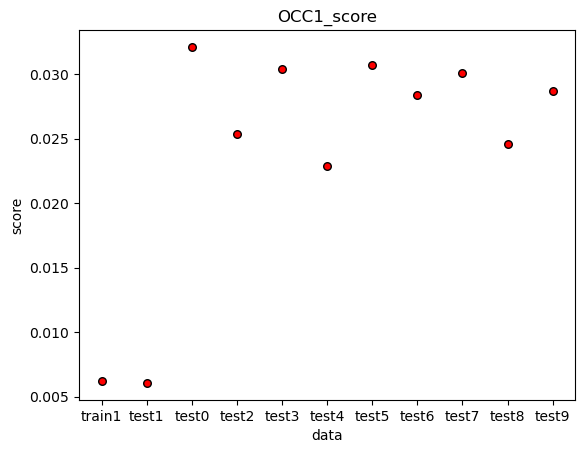

time: 172 ms (started: 2022-12-14 05:21:23 +09:00)


In [123]:
plt.xlabel("data")
plt.ylabel("score")
plt.title("OCC1_score") 
plt.scatter(x=["train1",'test1','test0','test2','test3','test4','test5','test6','test7','test8','test9'],y=score_stack,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC1/qsvdd/OCC1_score.png')
plt.show()

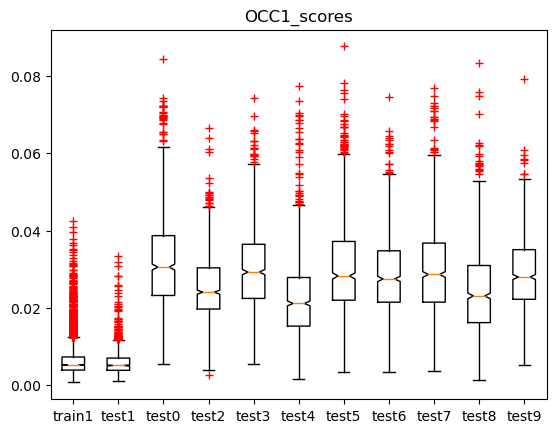

time: 203 ms (started: 2022-12-14 05:21:23 +09:00)


In [124]:
fig,ax = plt.subplots()
ax.boxplot([score_var_train,score_var_test0,score_var_test1,score_var_test2,score_var_test3,score_var_test4,score_var_test5,
score_var_test6,score_var_test7,score_var_test8,score_var_test9],notch=True,sym='r+')
plt.title('OCC1_scores')
plt.xticks([1,2,3,4,5,6,7,8,9,10,11],["train1",'test1','test0','test2','test3','test4','test5','test6','test7','test8','test9'])
plt.savefig('./img/OCC1/qsvdd/OCC1_scores.png')
plt.show()




### AUROC

In [125]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

time: 0 ns (started: 2022-12-14 05:21:23 +09:00)


In [126]:
def radius(data, center):
    res = []
    for j in range(len(data)):
        res.append(sum(abs(data - center)[j]**2))
    return res
        

time: 0 ns (started: 2022-12-14 05:21:23 +09:00)


In [127]:
radius_train0 = radius(data = predictions_exp0, center = center)
radius_test0 = radius(data = predictions_exp0_test, center = center)
radius_test1 = radius(data = predictions_exp1, center = center)
radius_test2 = radius(data = predictions_exp2, center = center)
radius_test3 = radius(data = predictions_exp3, center = center)
radius_test4 = radius(data = predictions_exp4, center = center)
radius_test5 = radius(data = predictions_exp5, center = center)
radius_test6 = radius(data = predictions_exp6, center = center)
radius_test7 = radius(data = predictions_exp7, center = center)
radius_test8 = radius(data = predictions_exp8, center = center)
radius_test9 = radius(data = predictions_exp9, center = center)



time: 3.31 s (started: 2022-12-14 05:21:23 +09:00)


In [128]:
y_pred0 = np.array(radius_test0)
y_true0 = np.zeros(len(radius_test0), dtype=int)
y_pred1 = np.array(radius_test1)
y_true1 = np.ones(len(radius_test1), dtype=int)
y_pred2 = np.array(radius_test2)
y_true2 = np.ones(len(radius_test2), dtype=int)
y_pred3 = np.array(radius_test3)
y_true3 = np.ones(len(radius_test3), dtype=int)
y_pred4 = np.array(radius_test4)
y_true4 = np.ones(len(radius_test4), dtype=int)
y_pred5 = np.array(radius_test5)
y_true5 = np.ones(len(radius_test5), dtype=int)
y_pred6 = np.array(radius_test6)
y_true6 = np.ones(len(radius_test6), dtype=int)
y_pred7 = np.array(radius_test7)
y_true7 = np.ones(len(radius_test7), dtype=int)
y_pred8 = np.array(radius_test8)
y_true8 = np.ones(len(radius_test8), dtype=int)
y_pred9 = np.array(radius_test9)
y_true9 = np.ones(len(radius_test9), dtype=int)

time: 0 ns (started: 2022-12-14 05:21:27 +09:00)


In [129]:
y_pred01 = np.concatenate((y_pred0,y_pred1),axis=None)
y_true01 = np.concatenate((y_true0,y_true1),axis=None)
y_pred02 = np.concatenate((y_pred0,y_pred2),axis=None)
y_true02 = np.concatenate((y_true0,y_true2),axis=None)
y_pred03 = np.concatenate((y_pred0,y_pred3),axis=None)
y_true03 = np.concatenate((y_true0,y_true3),axis=None)
y_pred04 = np.concatenate((y_pred0,y_pred4),axis=None)
y_true04 = np.concatenate((y_true0,y_true4),axis=None)
y_pred05 = np.concatenate((y_pred0,y_pred5),axis=None)
y_true05 = np.concatenate((y_true0,y_true5),axis=None)
y_pred06 = np.concatenate((y_pred0,y_pred6),axis=None)
y_true06 = np.concatenate((y_true0,y_true6),axis=None)
y_pred07 = np.concatenate((y_pred0,y_pred7),axis=None)
y_true07 = np.concatenate((y_true0,y_true7),axis=None)
y_pred08 = np.concatenate((y_pred0,y_pred8),axis=None)
y_true08 = np.concatenate((y_true0,y_true8),axis=None)
y_pred09 = np.concatenate((y_pred0,y_pred9),axis=None)
y_true09 = np.concatenate((y_true0,y_true9),axis=None)

time: 0 ns (started: 2022-12-14 05:21:27 +09:00)


In [130]:
# fpr, tpr, _ = roc_curve(y_true01, y_pred01)
# auc_measure = auc(fpr,tpr)
# auc_measure

time: 0 ns (started: 2022-12-14 05:21:27 +09:00)


In [131]:
fpr1, tpr1, _ = roc_curve(y_true01, y_pred01)
fpr2, tpr2, _ = roc_curve(y_true02, y_pred02)
fpr3, tpr3, _ = roc_curve(y_true03, y_pred03)
fpr4, tpr4, _ = roc_curve(y_true04, y_pred04)
fpr5, tpr5, _ = roc_curve(y_true05, y_pred05)
fpr6, tpr6, _ = roc_curve(y_true06, y_pred06)
fpr7, tpr7, _ = roc_curve(y_true07, y_pred07)
fpr8, tpr8, _ = roc_curve(y_true08, y_pred08)
fpr9, tpr9, _ = roc_curve(y_true09, y_pred09)

time: 15 ms (started: 2022-12-14 05:21:27 +09:00)


In [132]:
auc1 = roc_auc_score(y_true01,y_pred01)
auc2 = roc_auc_score(y_true02,y_pred02)
auc3 = roc_auc_score(y_true03,y_pred03)
auc4 = roc_auc_score(y_true04,y_pred04)
auc5 = roc_auc_score(y_true05,y_pred05)
auc6 = roc_auc_score(y_true06,y_pred06)
auc7 = roc_auc_score(y_true07,y_pred07)
auc8 = roc_auc_score(y_true08,y_pred08)
auc9 = roc_auc_score(y_true09,y_pred09)
auc = [auc1,auc2,auc3,auc4,auc5,auc6,auc7,auc8,auc9]

time: 15 ms (started: 2022-12-14 05:21:27 +09:00)


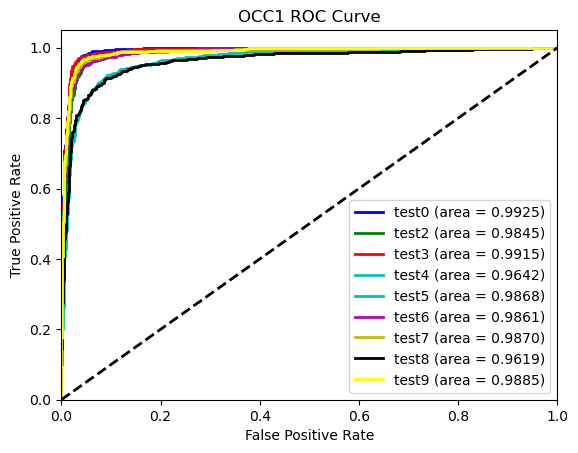

time: 234 ms (started: 2022-12-14 05:21:27 +09:00)


In [133]:
plt.figure()
lw = 2
plt.plot(fpr1,tpr1,color='b',lw=lw,label="test0 (area = %0.4f)" % auc1)
plt.plot(fpr2,tpr2,color="g",lw=lw,label="test2 (area = %0.4f)" % auc2)
plt.plot(fpr3,tpr3,color="r",lw=lw,label="test3 (area = %0.4f)" % auc3)
plt.plot(fpr4,tpr4,color="c",lw=lw,label="test4 (area = %0.4f)" % auc4)
plt.plot(fpr5,tpr5,color="c",lw=lw,label="test5 (area = %0.4f)" % auc5)
plt.plot(fpr6,tpr6,color="m",lw=lw,label="test6 (area = %0.4f)" % auc6)
plt.plot(fpr7,tpr7,color="y",lw=lw,label="test7 (area = %0.4f)" % auc7)
plt.plot(fpr8,tpr8,color="k",lw=lw,label="test8 (area = %0.4f)" % auc8)
plt.plot(fpr9,tpr9,color="yellow",lw=lw,label="test9 (area = %0.4f)" % auc9)







plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC1 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC1/qsvdd/OCC1_ROC.png')
plt.show()

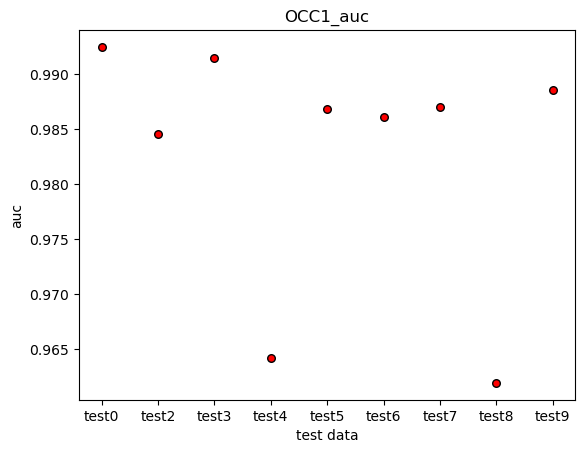

time: 141 ms (started: 2022-12-14 05:21:27 +09:00)


In [134]:
plt.xlabel("test data")
plt.ylabel("auc")
plt.title("OCC1_auc") 
plt.scatter(x=['test0','test2','test3','test4','test5','test6','test7','test8','test9'],y=auc,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC1/qsvdd/OCC1_auc.png')
plt.show()

In [135]:
print(auc)

[0.9924570709341005, 0.984503807669979, 0.9914642125005452, 0.9641673470486376, 0.9868058954696253, 0.9861100125996707, 0.9869881211539451, 0.9619363359234367, 0.9885331575293721]
time: 0 ns (started: 2022-12-14 05:21:27 +09:00)


In [136]:
savetxt('./img/OCC1/qsvdd/auc_OCC1.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:21:27 +09:00)


In [137]:
y_pred_ano = np.concatenate((y_pred1,y_pred2,y_pred3,y_pred4,y_pred5,y_pred6,y_pred7,y_pred8,y_pred9), axis=None)
y_true_ano = np.concatenate((y_true1,y_true2,y_true3,y_true4,y_true5,y_true6,y_true7,y_true8,y_true9), axis=None)
y_pred_all = np.concatenate((y_pred0,y_pred_ano),axis=None)
y_true_all = np.concatenate((y_true0,y_true_ano),axis=None)

time: 0 ns (started: 2022-12-14 05:21:27 +09:00)


In [138]:
fpr_all, tpr_all, _ = roc_curve(y_true_all, y_pred_all)
auc_all = roc_auc_score(y_true_all, y_pred_all)


time: 15 ms (started: 2022-12-14 05:21:27 +09:00)


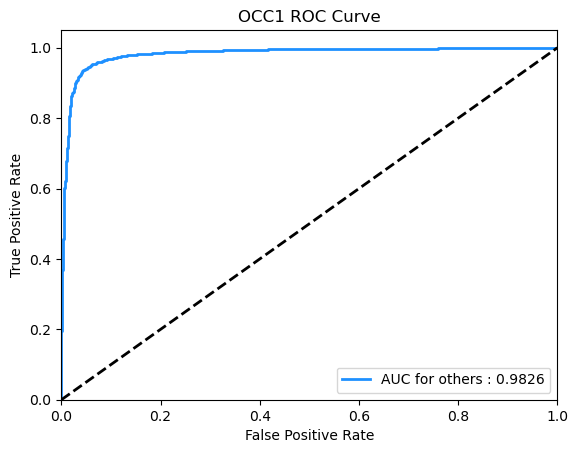

time: 172 ms (started: 2022-12-14 05:21:27 +09:00)


In [139]:
plt.figure()
lw = 2
plt.plot(fpr_all,tpr_all,color='dodgerblue',lw=lw,label="AUC for others : %0.4f" % auc_all)
plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC1 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC1/qsvdd/OCC1_ROC_all.png')
plt.show()

In [140]:
auc.append(auc_all)

time: 0 ns (started: 2022-12-14 05:21:28 +09:00)


In [141]:
auc

[0.9924570709341005,
 0.984503807669979,
 0.9914642125005452,
 0.9641673470486376,
 0.9868058954696253,
 0.9861100125996707,
 0.9869881211539451,
 0.9619363359234367,
 0.9885331575293721,
 0.9825952424497845]

time: 0 ns (started: 2022-12-14 05:21:28 +09:00)


In [142]:
savetxt('./img/OCC1/qsvdd/auc_OCC1.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:21:28 +09:00)
